In [1]:
import platform
import tensorflow as tf
import torch
import os

# Cek versi Python
print("Python Version:", platform.python_version())

# Cek GPU yang tersedia
gpu_info = tf.config.list_physical_devices('GPU')
if gpu_info:
    print("\nGPU TensorFlow Info:")
    print(tf.config.experimental.get_device_details(gpu_info[0]))
else:
    print("\nNo GPU available for TensorFlow.")

# Cek GPU untuk PyTorch
if torch.cuda.is_available():
    print("\nPyTorch GPU Info:")
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("GPU Memory:", f"{torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("\nNo GPU available for PyTorch.")

# Cek informasi perangkat keras lainnya
print("\nHardware Info:")
print("Number of CPUs:", os.cpu_count())


Python Version: 3.11.11

GPU TensorFlow Info:
{'compute_capability': (7, 5), 'device_name': 'Tesla T4'}

PyTorch GPU Info:
GPU Name: Tesla T4
GPU Memory: 15.83 GB

Hardware Info:
Number of CPUs: 2


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.1/994.1 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 66.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 32.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 51.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="EY2pDRbKs0yScLZ5S4ks")
project = rf.workspace("shootdetectoryolo").project("deteksi-shooting-basket")
version = project.version(11)
dataset = version.download("yolov9")

  Using cached roboflow-1.1.60-py3-none-any.whl.metadata (9.7 kB)
  Using cached idna-3.7-py3-none-any.whl.metadata (9.9 kB)
  Using cached opencv_python_headless-4.10.0.84-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached pillow_heif-0.22.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (9.6 kB)
  Using cached python_dotenv-1.1.0-py3-none-any.whl.metadata (24 kB)
  Using cached filetype-1.2.0-py2.py3-none-any.whl.metadata (6.5 kB)
Using cached roboflow-1.1.60-py3-none-any.whl (84 kB)
Using cached idna-3.7-py3-none-any.whl (66 kB)
Using cached opencv_python_headless-4.10.0.84-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (49.9 MB)
Using cached pillow_heif-0.22.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (7.8 MB)
Using cached filetype-1.2.0-py2.py3-none-any.whl (19 kB)
Using cached python_dotenv-1.1.0-py3-none-any.whl (20 kB)
  Attempting uninstall: opencv-python-headless
    Found existing installat


Extracting Dataset Version Zip to Deteksi-Shooting-basket-11 in yolov9:: 100%|██████████| 1264/1264 [00:00<00:00, 7107.73it/s]


In [ ]:
# import liblary
from ultralytics import YOLO

model = YOLO("yolov9m.pt")  # model yang akan di gunakan untuk pelatihan

# Melatih model dengan optimizer SGD
results = model.train(
    data="/content/Deteksi-Shooting-basket-11/data.yaml",   
    epochs=100,                                             # Jumlah epoch pelatihan
    imgsz=640,                                              # Ukuran input gambar
    lr0=0.01,                                               # Learning rate awal
    momentum=0.937,                                         # Momentum untuk optimizer
    optimizer="SGD",                                        # OPTIMIZER yang digunakan
    save=True,                                              
    save_period=10,                                         # Simpan setiap 10 epoch
    name="yolov9m_SGD"                                      # Nama eksperimen
)

# Simpan model hasil training   
model.save("yolov9m_SGD.pt")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 39.1M/39.1M [00:00<00:00, 136MB/s]


Ultralytics 8.3.104 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov9m.pt, data=/content/Deteksi-Shooting-basket-11/data.yaml, epochs=100, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=10, cache=False, device=None, workers=8, project=None, name=yolov9m_SGD, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, s

100%|██████████| 755k/755k [00:00<00:00, 19.1MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1    171648  ultralytics.nn.modules.block.RepNCSPELAN4    [64, 128, 128, 64, 1]         
  3                  -1  1    276960  ultralytics.nn.modules.block.AConv           [128, 240]                    
  4                  -1  1    629520  ultralytics.nn.modules.block.RepNCSPELAN4    [240, 240, 240, 120, 1]       
  5                  -1  1    778320  ultralytics.nn.modules.block.AConv           [240, 360]                    
  6                  -1  1   1414080  ultralytics.nn.modules.block.RepNCSPELAN4    [360, 360, 360, 180, 1]       
  7                  -1  1   1556160  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 106MB/s]


AMP: checks passed ✅


train: Scanning /content/Deteksi-Shooting-basket-11/train/labels... 438 images, 0 backgrounds, 0 corrupt: 100%|██████████| 438/438 [00:00<00:00, 2324.01it/s]


train: New cache created: /content/Deteksi-Shooting-basket-11/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Deteksi-Shooting-basket-11/valid/labels... 123 images, 0 backgrounds, 0 corrupt: 100%|██████████| 123/123 [00:00<00:00, 1367.04it/s]

val: New cache created: /content/Deteksi-Shooting-basket-11/valid/labels.cache


Plotting labels to runs/detect/yolov9m_SGD/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 149 weight(decay=0.0), 156 weight(decay=0.0005), 155 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov9m_SGD
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      7.81G       1.12      2.582      1.129         11        640: 100%|██████████| 28/28 [00:19<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.30it/s]

                   all        123        182      0.837      0.698      0.768      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.87G      0.909     0.9984      1.021         16        640: 100%|██████████| 28/28 [00:18<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.82it/s]

                   all        123        182      0.859      0.733      0.809      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.92G     0.9326      1.101      1.017          8        640: 100%|██████████| 28/28 [00:17<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        123        182      0.814      0.688      0.811      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      8.98G       1.07        1.1      1.038         10        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.653      0.722      0.783      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      9.04G      1.066     0.8969      1.008         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        123        182      0.837      0.752        0.8      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100       9.1G      1.046     0.7878      1.039         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182       0.87      0.767      0.808      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      9.15G     0.9931     0.7893       0.99          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.867      0.727      0.777      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      9.21G      1.001      0.799     0.9921         12        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        123        182      0.799      0.751      0.809      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      9.27G          1     0.6698     0.9967         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.854      0.717      0.806       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      9.33G      1.008     0.7126      1.005          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.924      0.779      0.843      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      9.38G     0.9465     0.6219     0.9861         11        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182      0.891      0.773      0.829      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      9.44G     0.9749     0.6416     0.9981         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.825      0.634       0.67      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       9.5G     0.9402     0.7005     0.9879         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.914       0.79      0.839      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      9.55G     0.9343     0.6442     0.9874         15        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        123        182      0.899       0.82      0.875      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      9.61G     0.9357     0.6209     0.9954         20        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.907      0.837      0.873      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      9.67G     0.9128     0.5918     0.9717         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182      0.914      0.872      0.887      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      9.73G     0.8983     0.5684       0.97         12        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        123        182      0.896      0.854      0.883      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      9.78G     0.9166      0.584     0.9855         14        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.921      0.799      0.849      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      9.84G     0.8856     0.5553     0.9706         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.951      0.792      0.865      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       9.9G      0.869     0.5593     0.9661         17        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

                   all        123        182      0.946      0.774      0.838      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      9.96G     0.9059     0.5473     0.9771         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.945      0.804      0.874       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100        10G     0.8666     0.5407     0.9552         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182       0.92      0.845      0.885      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      10.1G     0.8445     0.5204     0.9474         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all        123        182      0.884      0.742      0.802      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      10.1G      0.861     0.5241     0.9738          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.904      0.787       0.83      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      10.2G     0.8661     0.5369     0.9817         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182       0.95      0.846      0.897      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      10.2G      0.834     0.5141      0.953         12        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182      0.949      0.808      0.896      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      10.3G     0.8275     0.5291     0.9475         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.942       0.83      0.886      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      10.4G     0.8348     0.5653     0.9671          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182      0.924       0.85      0.878      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      10.4G      0.799     0.4756     0.9512          6        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        123        182      0.893      0.858      0.888      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      10.5G     0.8305     0.5024     0.9609         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.896      0.784      0.822      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      10.5G     0.8009     0.4852     0.9473         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.941      0.828      0.888      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      10.6G     0.7955     0.4936     0.9374         17        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.916      0.841      0.866      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      10.6G     0.7758     0.4884     0.9405         16        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.981      0.826      0.903      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      10.7G     0.7852     0.4862      0.958         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.938      0.831      0.885      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      10.8G     0.7611     0.4801     0.9171         11        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.971      0.851      0.915      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      10.8G     0.7967     0.5095     0.9342         14        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.953      0.848      0.917      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      10.9G     0.7403     0.4471     0.9124         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        123        182      0.923      0.872      0.912      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      10.9G     0.7927     0.5034     0.9414         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182      0.964      0.843      0.897       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100        11G     0.7745     0.4561     0.9353         15        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182      0.938      0.872      0.893      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100        11G     0.7309      0.447      0.933         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all        123        182       0.92      0.826      0.874      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      11.1G     0.7732     0.4596     0.9226         15        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.932      0.804       0.86      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      11.2G     0.7434     0.4483     0.9115         13        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182       0.94      0.838      0.904      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      11.2G     0.7539     0.4458     0.9346          7        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all        123        182      0.976      0.839      0.924      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      11.3G     0.7366     0.4603     0.9214         13        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182       0.95      0.814      0.884      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      11.3G     0.7827     0.4576     0.9141          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        123        182      0.943      0.859      0.909      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      11.4G     0.7272     0.4385     0.9193         14        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.77it/s]

                   all        123        182      0.948       0.87      0.927      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      11.4G     0.7155     0.4304     0.9085         14        640: 100%|██████████| 28/28 [00:18<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182      0.955      0.851      0.895      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      11.5G     0.7078     0.4113     0.9132         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.969      0.881      0.911       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      11.6G      0.726      0.433     0.9169         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.69it/s]

                   all        123        182      0.961      0.872      0.911      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      11.6G     0.7222     0.4125     0.9282          5        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182      0.931      0.864      0.893      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      11.7G     0.6965     0.4192     0.8844         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.944      0.872      0.919      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      11.7G     0.7079     0.3986     0.8917          8        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]

                   all        123        182      0.937      0.826      0.894       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      11.8G     0.7253     0.4403     0.9074         11        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.977      0.835      0.901      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      11.8G     0.7042     0.4029     0.9002          7        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.983      0.841      0.918      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      11.9G     0.7093     0.4362     0.9046          8        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.69it/s]

                   all        123        182       0.95      0.883      0.927        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100        12G     0.7198     0.4428     0.9215         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182      0.934       0.87      0.906      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100        12G     0.7173     0.4166       0.91          6        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.966      0.889      0.925      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      12.1G      0.678     0.3855     0.8935          7        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.69it/s]

                   all        123        182      0.955        0.9      0.927      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      12.2G     0.7005     0.4219     0.8992         10        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.948      0.859      0.902      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      12.3G     0.6812     0.4012     0.8927          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.963      0.863      0.903      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      12.3G     0.6678     0.4033     0.9026         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]

                   all        123        182      0.943      0.892       0.92        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      12.4G     0.6772     0.3918     0.8925         16        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182       0.97      0.892      0.929      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      12.5G     0.6618     0.3855     0.8867         14        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182      0.951      0.881      0.916      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      12.6G     0.6466     0.3766     0.8712          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.77it/s]

                   all        123        182      0.953      0.877      0.919      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      12.6G     0.6315     0.3536     0.9001         13        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.956      0.858      0.912      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      12.7G     0.6431     0.3771     0.8881         18        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.975      0.867      0.925      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      12.8G     0.6414     0.3646     0.8857         19        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.82it/s]

                   all        123        182      0.967      0.846      0.911      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      12.8G     0.6504     0.3565     0.8981         16        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.968      0.866      0.922      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      12.9G      0.636     0.3729     0.8914         18        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.968      0.877      0.921      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100        13G     0.6291     0.3643     0.8799          6        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        123        182      0.949      0.878      0.916      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      13.1G     0.6459     0.3526     0.8894         13        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.924      0.897      0.917       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      13.2G     0.6116     0.3502      0.878          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.929      0.846      0.902      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      13.2G     0.6228     0.3625      0.893         19        640: 100%|██████████| 28/28 [00:18<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.939      0.872      0.928      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      13.3G     0.6084     0.3526     0.8759          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        123        182      0.931      0.868      0.928        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.25G     0.6042     0.3429     0.8936          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.941      0.879      0.939       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      9.22G     0.6027     0.3307     0.8698         16        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]

                   all        123        182      0.943      0.885      0.924      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      9.22G     0.5938     0.3544     0.8664         20        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.929      0.898      0.936      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      9.22G     0.6124     0.3486     0.8732         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.927      0.887      0.923      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      9.22G     0.5811     0.3428     0.8676         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.78it/s]

                   all        123        182      0.911      0.903      0.928      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      9.22G     0.5917     0.3427     0.8721          9        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.978      0.877      0.932      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      9.22G     0.5955     0.3353     0.8705         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.971      0.856      0.914      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      9.22G       0.56     0.3198     0.8654         12        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all        123        182       0.94      0.856      0.903        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      9.22G     0.6014     0.3305     0.8614          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.931      0.863      0.906       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      9.22G     0.5723     0.3367     0.8658         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.918      0.908      0.904      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      9.28G     0.5376     0.3045     0.8623         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.912      0.876      0.895      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      9.33G     0.5701     0.3353      0.874         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.938      0.861      0.894      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      9.39G     0.5888      0.327     0.8735         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all        123        182      0.942      0.843      0.886      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      9.45G     0.5396      0.298     0.8586         14        640: 100%|██████████| 28/28 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.943      0.856      0.906      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100       9.5G     0.5416     0.2891     0.8621         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.948      0.885      0.928      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      9.56G     0.5656     0.3075     0.8648          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]

                   all        123        182      0.934      0.862      0.897      0.695


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      9.62G     0.5402     0.3083     0.8562         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        123        182      0.904      0.876      0.888      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      9.67G     0.5153     0.2816     0.8602          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.949      0.863      0.894      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      9.73G     0.5316     0.2872     0.8644         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.82it/s]

                   all        123        182       0.95      0.869      0.896      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      9.79G     0.5185     0.2792     0.8558          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182       0.94      0.863      0.881      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      9.85G     0.5173     0.2754     0.8542          8        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.949      0.869      0.884      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       9.9G     0.4999     0.2663     0.8455         12        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        123        182      0.941      0.856      0.874      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      9.96G     0.5037     0.2679     0.8477         11        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        123        182      0.927      0.863      0.875      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100        10G        0.5     0.2642     0.8555          6        640: 100%|██████████| 28/28 [00:18<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        123        182      0.936      0.865      0.885       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      10.1G     0.4913      0.263     0.8436         10        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        123        182      0.924      0.878      0.893       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      10.1G     0.4998     0.2635      0.843          9        640: 100%|██████████| 28/28 [00:18<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        123        182      0.933      0.869      0.883      0.689



100 epochs completed in 0.585 hours.
Optimizer stripped from runs/detect/yolov9m_SGD/weights/last.pt, 40.8MB
Optimizer stripped from runs/detect/yolov9m_SGD/weights/best.pt, 40.8MB

Validating runs/detect/yolov9m_SGD/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9m summary (fused): 151 layers, 20,014,438 parameters, 0 gradients, 76.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.07s/it]


                   all        123        182      0.981      0.877      0.932      0.723
            Basketball         76         76      0.963      0.763       0.87      0.573
       Basketball Hoop        106        106      0.998      0.991      0.995      0.873
Speed: 0.3ms preprocess, 15.2ms inference, 0.0ms loss, 5.0ms postprocess per image
Results saved to runs/detect/yolov9m_SGD


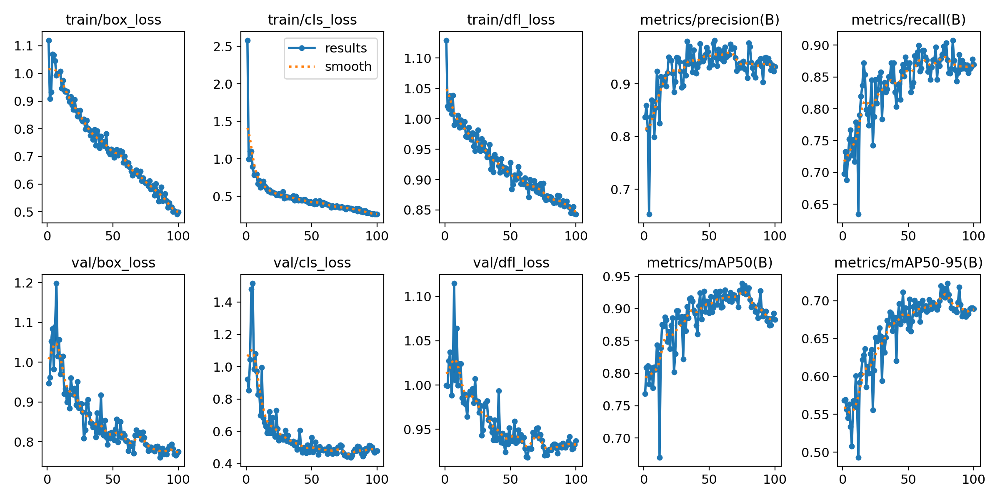

In [3]:
import os
from IPython.display import Image as IPyImage

# Path ke folder hasil training
train_folder = "runs/detect/yolov9m_SGD"  # Sesuaikan jika path berbeda

# Path ke file results.png
results_image_path = os.path.join(train_folder, "results.png")

# Periksa keberadaan file dan tampilkan
if os.path.exists(results_image_path):
    display(IPyImage(filename=results_image_path, width=600))
else:
    print("File 'results.png' tidak ditemukan. Pastikan proses training selesai dan file tersedia.")


In [4]:
from ultralytics import YOLO

# Load model hasil training
model = YOLO("runs/detect/yolov9m_SGD/weights/best.pt")

# Jalankan inferensi pada folder test
results = model.predict(source="/content/Deteksi-Shooting-basket-11/test/images", save=True)



image 1/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0007_jpg.rf.c50d8e04c5c44c5adfc637292629977f.jpg: 640x640 1 Basketball, 40.2ms
image 2/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0009_jpg.rf.dae8363a59687ed34abdebd3f28a2d5e.jpg: 640x640 1 Basketball, 38.1ms
image 3/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0011_jpg.rf.3b14dc8329870a55746c44080f943429.jpg: 640x640 (no detections), 37.8ms
image 4/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0025_jpg.rf.ef50d41096b536faccfd21daeb1014f1.jpg: 640x640 1 Basketball, 37.8ms
image 5/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0038_jpg.rf.1ca1d18eb48a23955391642020b913d8.jpg: 640x640 1 Basketball, 1 Basketball Hoop, 37.8ms
image 6/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0047_jpg.rf.b66d7d10aaaa84c25e8101dd5997cb7c.jpg: 640x640 1 Basketball, 25.8ms
image 7/65 /content/Deteksi-Shooting-basket-11/test/images/2_mp4-0048_jpg.rf.553f649e151e562f4798c8ee68f3a970.jpg

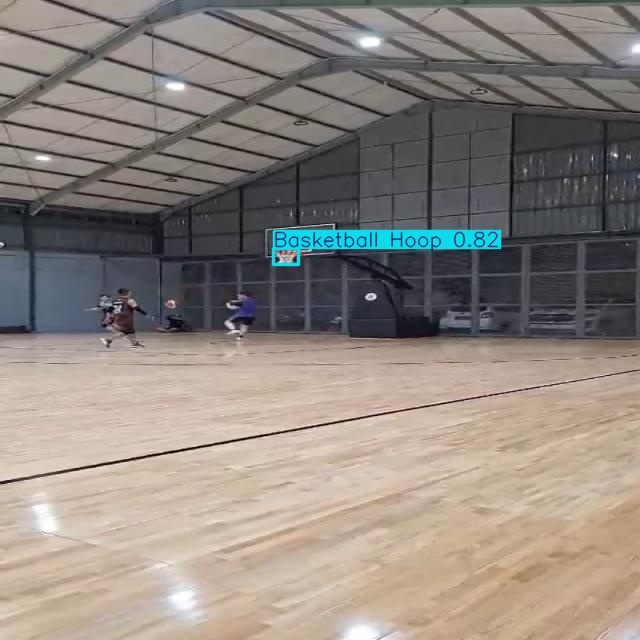

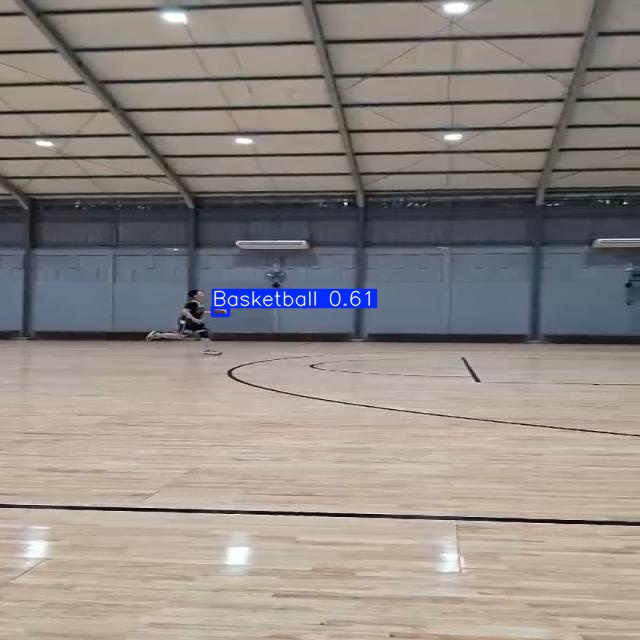

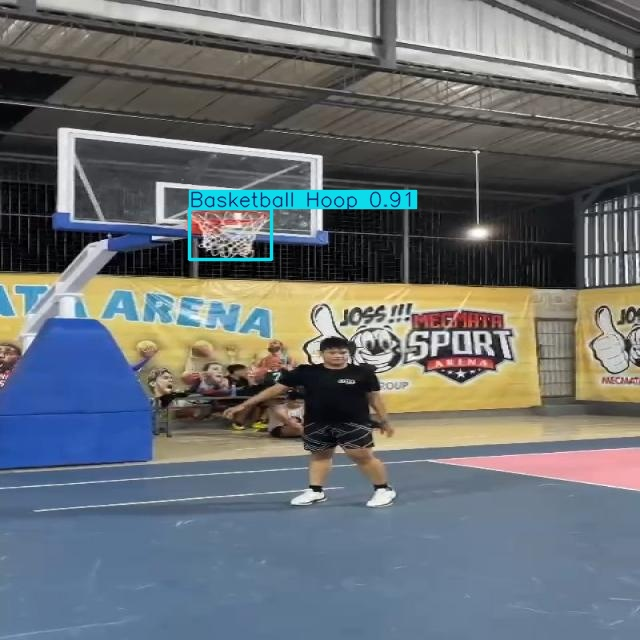

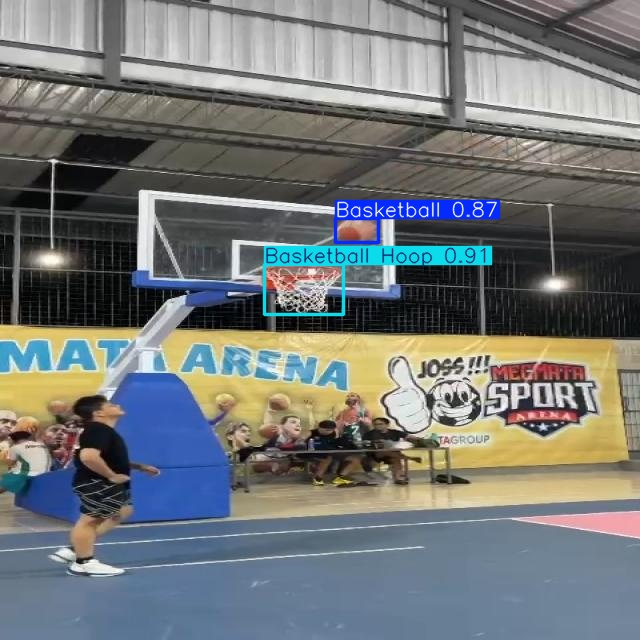

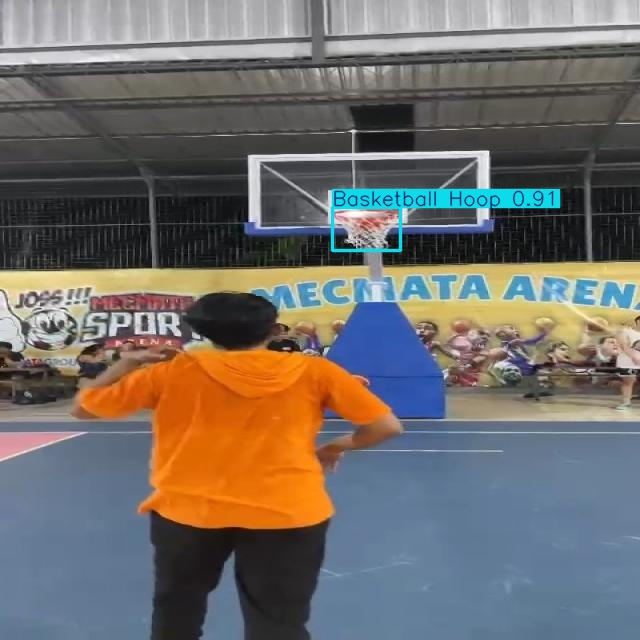

...

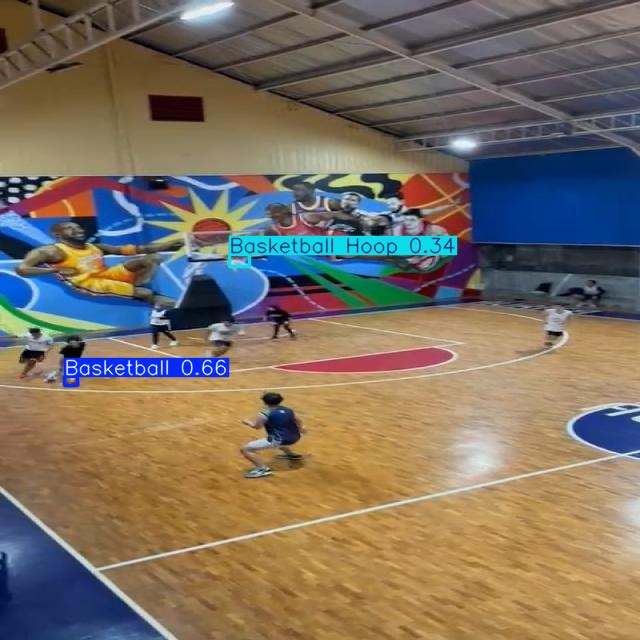

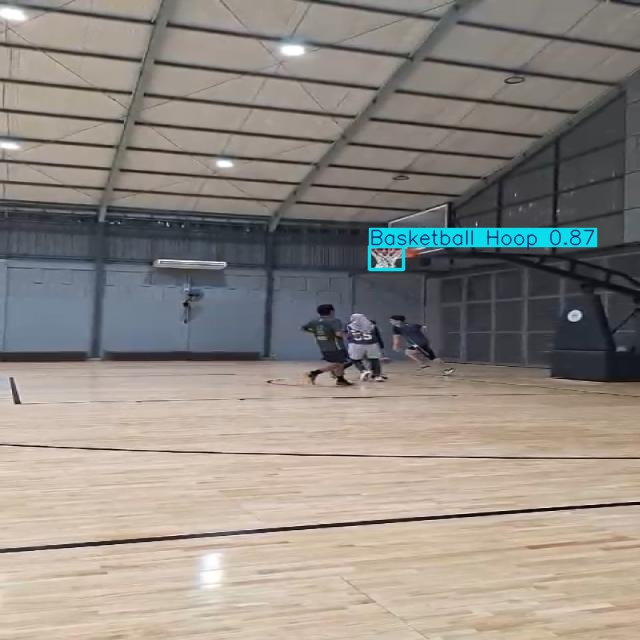

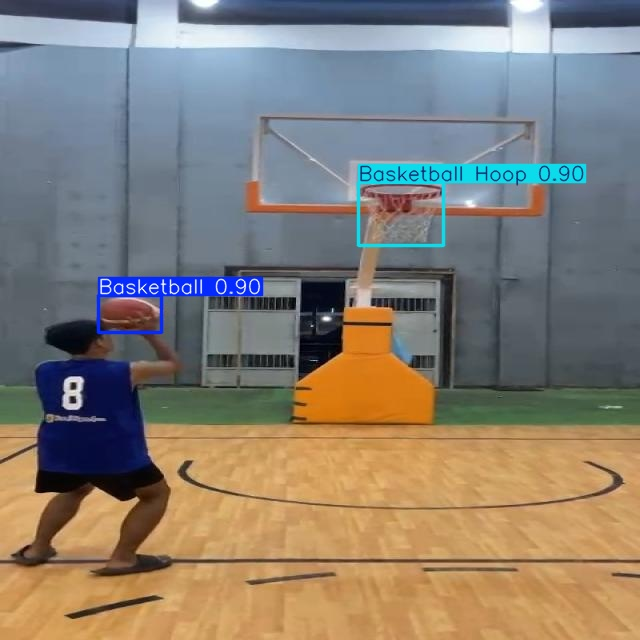

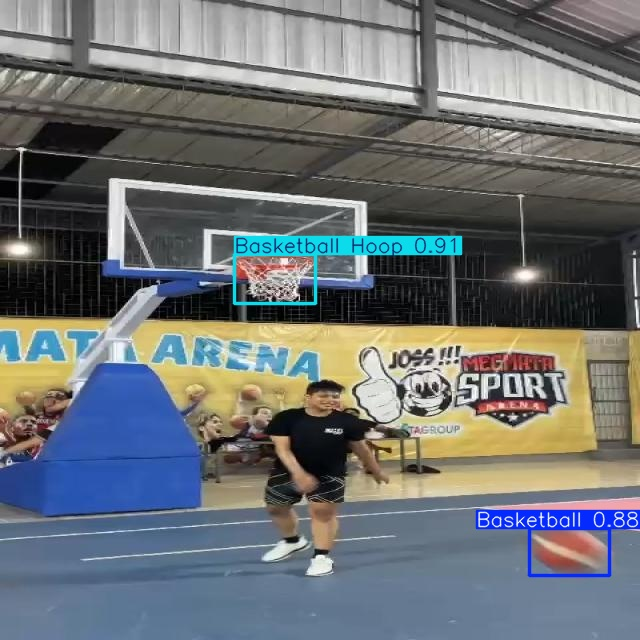

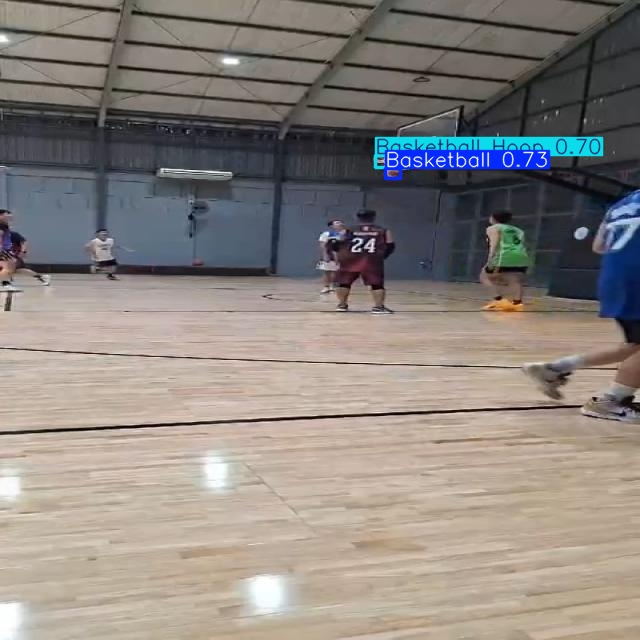

In [5]:
import os
from IPython.display import Image, display

# Path hasil prediksi
pred_path = "runs/detect/predict/"

# Tampilkan semua gambar hasil prediksi
for img_file in os.listdir(pred_path):
    if img_file.endswith(".jpg") or img_file.endswith(".png"):
        display(Image(filename=os.path.join(pred_path, img_file), width=800))


In [1]:
from ultralytics import YOLO
import cv2

# Memuat model
model = YOLO('E:\KULIAH\SKRIPSI\PROGRAM/yolov9m_SGD_lr0.01_m0.937.pt')

# Input dan output video
input_video = 'E:\KULIAH\SKRIPSI\PROGRAM\Bangteo2.mp4'
cap = cv2.VideoCapture(input_video)

# Memeriksa apakah video berhasil dibuka
if not cap.isOpened():
    print("Error: Tidak dapat membuka video")
    exit()

# Properti Video
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Output video
output_video = 'E:\KULIAH\SKRIPSI\PROGRAM\OUTPUT FIX\ini nyoba program baru\Output_Bangteo2_yolov9m_SGD_lr0.01_m0.937.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video, fourcc, fps, (frame_width, frame_height))

# Variabel untuk melacak lintasan bola, posisi ring, skor, dan percobaan
basket_trajectory = []
ring_position = None
score = 0
attempts = 0
MAX_TRAJECTORY_POINTS = 15

# Untuk rata-rata confidence
basketball_confidences = []
hoop_confidences = []

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame)

    for result in results:
        for box in result.boxes:
            confidence = float(box.conf)
            x1, y1, x2, y2 = box.xyxy[0].int().tolist()
            class_id = int(box.cls)
            class_names = ['basketball', 'basketball hoop']

            if class_id < len(class_names):
                label = class_names[class_id]

                # Threshold
                if label == 'basketball' and confidence < 0.80:
                    continue
                if label == 'basketball hoop' and confidence < 0.80:
                    continue

                color = (0, 255, 0) if label == 'basketball' else (255, 0, 0)
                cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
                cv2.putText(frame, f"{label} {confidence:.2f}", (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

                if label == 'basketball':
                    ball_center = ((x1 + x2) // 2, (y1 + y2) // 2)
                    basket_trajectory.append(ball_center)

                    if len(basket_trajectory) > MAX_TRAJECTORY_POINTS:
                        basket_trajectory.pop(0)

                    for point in basket_trajectory:
                        cv2.circle(frame, point, 3, (0, 255, 255), -1)

                    basketball_confidences.append(confidence)

                elif label == 'basketball hoop':
                    ring_position = (x1, y1, x2, y2)
                    hoop_confidences.append(confidence)

    # Cek dan gambar posisi ring
    if ring_position:
        x1, y1, x2, y2 = ring_position
        ring_bottom_y = y1 + (3 * (y2 - y1)) // 4
        # cv2.line(frame, (x1, ring_bottom_y), (x2, ring_bottom_y), (0, 0, 255), 2)

    # Deteksi tembakan masuk
    if ring_position and len(basket_trajectory) > 1:
        x1, y1, x2, y2 = ring_position
        ring_bottom_y = y1 + (3 * (y2 - y1)) // 4
        Xr1 = x1
        Xr2 = x2

        for i in range(1, len(basket_trajectory)):
            prev_y = basket_trajectory[i - 1][1]
            curr_y = basket_trajectory[i][1]
            prev_x = basket_trajectory[i - 1][0]
            curr_x = basket_trajectory[i][0]

            if prev_y < ring_bottom_y and curr_y >= ring_bottom_y:
                attempts += 1
                if curr_x < Xr1 or curr_x > Xr2:
                    print("Tembakan keluar dari batas kiri/kanan ring!")
                    basket_trajectory = []
                    break

                score += 1
                print(f"Tembakan masuk! Skor saat ini: {score}, Percobaan: {attempts}")
                basket_trajectory = []
                break

    fg_percentage = (score / attempts * 100) if attempts > 0 else 0.00

    # Rata-rata confidence
    avg_basketball_conf = sum(basketball_confidences) / len(basketball_confidences) if basketball_confidences else 0.0
    avg_hoop_conf = sum(hoop_confidences) / len(hoop_confidences) if hoop_confidences else 0.0

    # Tampilkan hasil di frame
    cv2.putText(frame, f"Score: {score} | Attempts: {attempts} | FG%: {fg_percentage:.2f}%", 
                (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (8, 255, 255), 2)

    cv2.putText(frame, f"Avg Basketball Conf: {avg_basketball_conf:.2f}", 
                (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    cv2.putText(frame, f"Avg Hoop Conf: {avg_hoop_conf:.2f}", 
                (10, 80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    out.write(frame)
    cv2.imshow('Detection', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Video telah diproses dan disimpan sebagai {output_video}")


WARNING  Python>=3.10 is required, but Python==3.9.13 is currently installed 

0: 640x384 1 Basketball, 1 Basketball Hoop, 598.7ms
Speed: 2.0ms preprocess, 598.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 426.3ms
Speed: 3.8ms preprocess, 426.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 545.3ms
Speed: 5.3ms preprocess, 545.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 514.4ms
Speed: 3.2ms preprocess, 514.4ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 522.3ms
Speed: 3.4ms preprocess, 522.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 442.5ms
Speed: 3.5ms preprocess, 442.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop,

# Ini pake Linear Trendline

In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np

# Memuat model
model = YOLO('E:\KULIAH\SKRIPSI\PROGRAM/yolov9m_SGD_lr0.01_m0.937.pt')

# Input dan output video
input_video = 'E:\KULIAH\SKRIPSI\PROGRAM\Bangteo2.mp4'
cap = cv2.VideoCapture(input_video)

# Properti Video
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Output video
output_video = 'E:\KULIAH\SKRIPSI\PROGRAM\OUTPUT FIX\INI PAKE LINEAR TRENDLINE\Output_YOLOv9m_lr0.01_m0937.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video, fourcc, fps, (frame_width, frame_height))

# Variabel untuk melacak lintasan bola dan trendline
lintasan_bolaBasket = []
ring_position = None
score = 0
attempts = 0
MAX_Titik_Lintasan = 15  # Jumlah maksimum titik lintasan yang disimpan

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame)

    for result in results:
        for box in result.boxes:
            confidence = float(box.conf)
            x1, y1, x2, y2 = box.xyxy[0].int().tolist()
            class_id = int(box.cls)
            class_names = ['basketball', 'basketball hoop']

            if class_id < len(class_names):
                label = class_names[class_id]

                # Threshold confidence
                if confidence < 0.80:
                    continue

                color = (0, 255, 0) if label == 'basketball' else (255, 0, 0)
                cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
                cv2.putText(frame, f"{label} {confidence:.2f}", (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

                if label == 'basketball':
                    ball_center = ((x1 + x2) // 2, (y1 + y2) // 2)
                    lintasan_bolaBasket.append(ball_center)

                    if len(lintasan_bolaBasket) > MAX_Titik_Lintasan:
                        lintasan_bolaBasket.pop(0)

                    # Gambar titik lintasan
                    for point in lintasan_bolaBasket:
                        cv2.circle(frame, point, 3, (0, 255, 255), -1)

                    # Hitung linear trendline jika ada cukup titik
                    if len(lintasan_bolaBasket) >= 2:
                        x = np.array([p[0] for p in lintasan_bolaBasket])
                        y = np.array([p[1] for p in lintasan_bolaBasket])
                        A = np.vstack([x, np.ones(len(x))]).T
                        m, c = np.linalg.lstsq(A, y, rcond=None)[0]

                        # Gambar trendline (merah)
                        start_x = x[0]
                        end_x = x[-1] + 50  # Perpanjang 50 piksel ke depan
                        cv2.line(frame, 
                                 (int(start_x), int(m * start_x + c)),
                                 (int(end_x), int(m * end_x + c)),
                                 (0, 0, 255), 2)

                        # Prediksi posisi berikutnya (hijau)
                        predicted_x = x[-1] + 20
                        predicted_y = m * predicted_x + c
                        cv2.circle(frame, (int(predicted_x), int(predicted_y)), 5, (0, 255, 0), -1)

                elif label == 'basketball hoop':
                    ring_position = (x1, y1, x2, y2)

    # Deteksi tembakan masuk (logika asli Anda)
    if ring_position and len(lintasan_bolaBasket) > 1:
        x1, y1, x2, y2 = ring_position
        ring_bottom_y = y1 + (3 * (y2 - y1)) // 4

        for i in range(1, len(lintasan_bolaBasket)):
            prev_y = lintasan_bolaBasket[i-1][1]
            curr_y = lintasan_bolaBasket[i][1]
            curr_x = lintasan_bolaBasket[i][0]

            if prev_y < ring_bottom_y and curr_y >= ring_bottom_y:
                attempts += 1
                if x1 <= curr_x <= x2:
                    score += 1
                lintasan_bolaBasket = []
                break

    # Tampilkan skor
    fg_percentage = (score / attempts * 100) if attempts > 0 else 0.0
    cv2.putText(frame, f"Score: {score} | Attempts: {attempts} | FG%: {fg_percentage:.2f}%", 
                (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2)

    out.write(frame)
    cv2.imshow('Deteksi_YOLOv9m_SGD_lr0.01_m0.937', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()

WARNING  Python>=3.10 is required, but Python==3.9.13 is currently installed 

0: 640x384 1 Basketball, 1 Basketball Hoop, 1227.3ms
Speed: 12.1ms preprocess, 1227.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 1200.3ms
Speed: 8.0ms preprocess, 1200.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 2367.2ms
Speed: 6.1ms preprocess, 2367.2ms inference, 6.1ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 1967.4ms
Speed: 10.2ms preprocess, 1967.4ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball, 1 Basketball Hoop, 1067.7ms
Speed: 8.5ms preprocess, 1067.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Basketball Hoop, 844.6ms
Speed: 6.1ms preprocess, 844.6ms inference, 5.8ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 Bask